# Cell clustering from mCH (Fig 3G,H, S22, S23A)

Part of the **[Fig. 3 chapter](fig3.md)** — see it for the panel-by-panel map. The first code cell sets `ENTEX_ROOT` and activates the no-overwrite guard (see the [Reproduction guide](../reproduce.md)). *Outputs shown are the author's original run.*


## 📥 Required input files

This notebook reads the following files (paths resolve from `ENTEX_ROOT`/`REF_ROOT`; the setup cell sets them). See the chapter's `inputs.md` for RAW-vs-derived tags.

- `f'{indir}clustering/merged/5kCG100k3C_summary.h5ad'`  ·  _joint summary obj_
- `f'{indir}clustering/merged/L2final_celltype_L2both_new.tsv'`  ·  _table_
- `f'{indir}L1color.tsv'`  ·  _metadata: color_
- `f'{indir}tissuecolor.tsv'`  ·  _metadata: color_
- `f'{outdir}cell_{meta.shape[0]}_100kCH.h5ad'`  ·  _metadata_
- `f'{outdir}cell_86689_100kCH.h5ad'`  ·  _other_
- `f'{outdir}L1/{xx}/100kCH_embed.h5ad'`  ·  _embedding h5ad_
- `f'{outdir}tissue/{xx}/100kCH_embed.h5ad'`  ·  _embedding h5ad_


In [1]:
# === Reproduction setup — edit ENTEX_ROOT / REF_ROOT for your machine ===
import os, sys

ENTEX_ROOT = os.environ.get("ENTEX_ROOT", "/large_storage/zhoulab/zhoujt/project/ENTEx")
REF_ROOT = os.environ.get("REF_ROOT", "/large_storage/zhoulab/ref")
BOOK_ROOT = os.environ.get("BOOK_ROOT", f"{ENTEX_ROOT}/analysis/HumanCellEpigenomeAtlas")
sys.path.insert(0, BOOK_ROOT)
os.chdir(f"{ENTEX_ROOT}/analysis")  # original working directory
import repro_guard  # no-overwrite guard (default: skip existing)

In [2]:
from ALLCools.clustering import significant_pc_test, tsne
from ALLCools.plot import categorical_scatter, continuous_scatter
import warnings
from glob import glob

import anndata
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from ALLCools.mcds import MCDS
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (average_precision_score, pairwise_distances,
                             roc_auc_score)
from sklearn.model_selection import StratifiedKFold

In [3]:
mpl.style.use("default")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "Helvetica"

warnings.filterwarnings("ignore")

In [4]:
def dump_embedding(adata, name, n_dim=2):
    # put manifold coordinates into adata.obs
    for i in range(n_dim):
        adata.obs[f"{name}_{i}"] = adata.obsm[f"X_{name}"][:, i]
    return adata

In [5]:
indir = f"{ENTEX_ROOT}/"
outdir = f"{indir}analysis/mCH_clustering/"

In [6]:
meta = anndata.read_h5ad(f"{indir}clustering/merged/5kCG100k3C_summary.h5ad").obs

In [7]:
meta["L1"] = meta["L1"].astype(str)
meta.loc[meta["L1"] == "c7", "L1"] = "c35"
meta.loc[(meta["L1"] == "c35") & meta["L2_any"].isin(["c0", "c10", "c11"]), "L1"] = "c36"

In [8]:
gene_meta_path = f"{REF_ROOT}/hg38/gencode/v30/gencode.v30.annotation.gene.flat.tsv.gz"
black_list_path = f"{REF_ROOT}/blacklist/hg38-blacklist.v2.bed.gz"

chrom_to_remove = ["chrL", "chrM", "chrX", "chrY"]

In [9]:
mcds_path_list = np.sort(glob(f"{indir}mcds/*.mcds"))
print(len(mcds_path_list))

In [10]:
obs_dim = "cell"
var_dim = "chrom100k"

In [11]:
mcds = MCDS.open(mcds_path_list, var_dim=var_dim)
mcds

In [12]:
mcds = mcds.sel({obs_dim: mcds.get_index("cell").intersection(meta.index)})
mcds = mcds.remove_chromosome(exclude_chromosome=chrom_to_remove, var_dim=var_dim)
mcds = mcds.remove_black_list_region(black_list_path=black_list_path, f=0.5)

In [13]:
mc_type = "CHN"
feature_cov_mean = (
    mcds[f"{var_dim}_da"].sel(mc_type=mc_type, count_type="cov").mean(dim=obs_dim).to_pandas()
)

In [14]:
use_features = feature_cov_mean[feature_cov_mean > 1000].index
mcds = mcds.sel({var_dim: use_features})
mcds.add_mc_frac(var_dim=var_dim, normalize_per_cell=True, clip_norm_value=10)

In [15]:
mch_adata = mcds.get_adata(mc_type=mc_type, var_dim=var_dim, select_hvf=False)

In [16]:
model = PCA(n_components=100, svd_solver="arpack", random_state=0)
mch_adata.obsm["pca_all"] = model.fit_transform(mch_adata.X)
npc = significant_pc_test(mch_adata, obsm="pca_all", p_cutoff=0.01, update=False)

In [17]:
npc = 50
mch_adata.obsm["100kCH_pca"] = mch_adata.obsm["pca_all"][:, :npc].copy()
tsne(mch_adata, obsm="100kCH_pca", metric="euclidean", exaggeration=-1, perplexity=50, n_jobs=-1)
mch_adata.obsm[f"100kCH_pc{npc}_tsne"] = mch_adata.obsm["X_tsne"].copy()

In [18]:
mch_adata = mch_adata[meta.index].copy()
mch_adata.obs = meta.copy()

In [19]:
L1_meta = pd.read_csv(f"{indir}L1color.tsv", sep="\t", header=0, index_col=0)
L1_annot = L1_meta["L1_abbr"].to_dict()
L1_color = L1_meta["color"].to_dict()
L1_color.update({L1_annot[k]: L1_color[k] for k in L1_annot if k in L1_color})  # also key by name

In [20]:
tissue_meta = pd.read_csv(f"{indir}tissuecolor.tsv", sep="\t", header=0, index_col=0)
tissue_color = tissue_meta["color"].to_dict()

In [21]:
mch_adata = anndata.read_h5ad(f"{outdir}cell_{meta.shape[0]}_100kCH.h5ad")

In [22]:
mch_adata.obs = meta.loc[mch_adata.obs.index].copy()

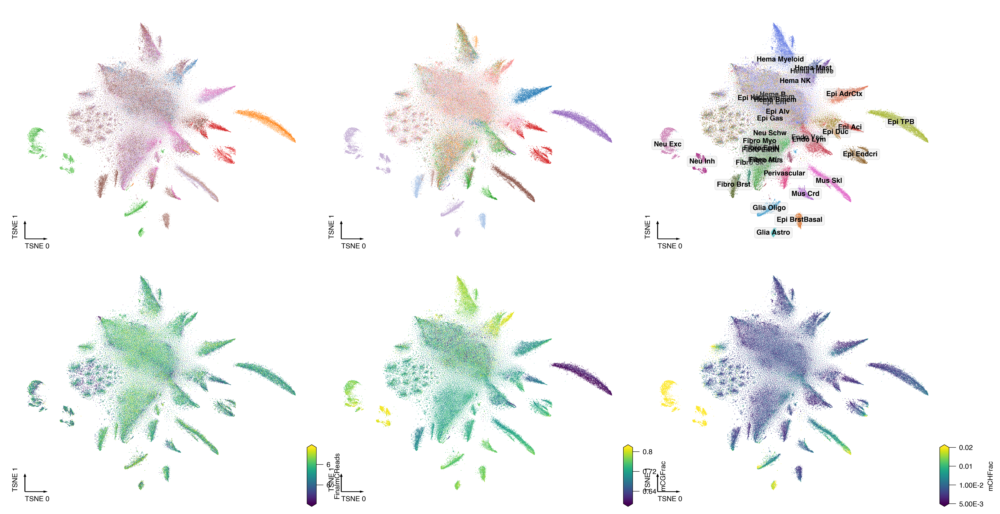

In [23]:
ds = 0.2
npc = 50
coord_base = "tsne"
mch_adata.obsm[f"X_{coord_base}"] = mch_adata.obsm[f"100kCH_pc{npc}_{coord_base}"].copy()
dump_embedding(mch_adata, coord_base)

fig, axes = plt.subplots(2, 3, figsize=(15, 8), dpi=300, constrained_layout=True)

tmp = mch_adata.obs.copy()
ax = axes[0, 0]
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    hue="Donor",
    s=ds,
    labelsize=8,
    max_points=None,
    palette="tab20",
    scatter_kws={"rasterized": True},
)

ax = axes[0, 1]
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    hue="Tissue",
    s=ds,
    labelsize=8,
    max_points=None,
    palette=tissue_color,
    scatter_kws={"rasterized": True},
)

ax = axes[0, 2]
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    hue="L1",
    text_anno=tmp["L1"].map(L1_annot),
    s=ds,
    labelsize=8,
    max_points=None,
    palette=L1_color,
    scatter_kws={"rasterized": True},
)


ax = axes[1, 0]
_ = continuous_scatter(
    ax=ax,
    data=tmp,
    hue=np.log10(tmp["FinalmCReads"] + 1),
    scatter_kws={"rasterized": True},
    coord_base=coord_base,
    max_points=None,
    labelsize=8,
    s=ds,
)

ax = axes[1, 1]
_ = continuous_scatter(
    ax=ax,
    data=tmp,
    hue="mCGFrac",
    scatter_kws={"rasterized": True},
    coord_base=coord_base,
    max_points=None,
    labelsize=8,
    s=ds,
)

ax = axes[1, 2]
_ = continuous_scatter(
    ax=ax,
    data=tmp,
    hue="mCHFrac",
    scatter_kws={"rasterized": True},
    coord_base=coord_base,
    max_points=None,
    labelsize=8,
    hue_norm=[0.005, 0.02],
    s=ds,
)

fig.savefig(f"{outdir}All_100kCH_meta.pdf", transparent=True)

In [24]:
ds = 0.2
npc = 50
coord_base = "tsne"

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300, constrained_layout=True)

tmp = mch_adata.obs.copy()
ax = axes[0]
_ = categorical_scatter(
    data=tmp,
    ax=ax,
    coord_base=coord_base,
    hue="L1",
    s=ds,
    labelsize=8,
    max_points=None,
    palette=L1_color,
    scatter_kws={"rasterized": True},
)

for xx, yy in L1_annot.items():
    x, y = np.mean(mch_adata.obsm[f"X_{coord_base}"][tmp["L1"] == xx], axis=0)
    ax.text(x, y, yy, ha="center", va="center", fontsize=8)


ax = axes[1]
_ = continuous_scatter(
    ax=ax,
    data=tmp,
    hue="mCHFrac",
    scatter_kws={"rasterized": True},
    coord_base=coord_base,
    max_points=None,
    labelsize=8,
    cmap="vlag",
    hue_norm=[0.005, 0.02],
    s=ds,
)

fig.savefig(f"{outdir}All_100kCH_meta.pdf", transparent=True)

In [25]:
mch_adata.write_h5ad(f"{outdir}cell_{mch_adata.shape[0]}_100kCH.h5ad")

In [26]:
mch_adata = anndata.read_h5ad(f"{outdir}cell_86689_100kCH.h5ad")

In [27]:
clf = LogisticRegression(class_weight="balanced")
skf = StratifiedKFold(n_splits=3, shuffle=True)
label = mch_adata.obs["L1"].copy()
leg = pd.Index(np.sort(label.unique()))
count = label.astype(str).value_counts()
score = np.zeros((2, len(leg), len(leg)))
data = mch_adata.obsm["100kCH_pca"].copy()
for i in np.arange(len(leg) - 1):
    for j in np.arange(i + 1, len(leg)):
        selc = label.isin([leg[i], leg[j]])
        if count.loc[leg[i]] < count.loc[leg[j]]:
            label_dict = {leg[i]: 1, leg[j]: 0}
        else:
            label_dict = {leg[i]: 0, leg[j]: 1}
        X = data[selc]
        y = label.values[selc].map(label_dict)
        pred = np.zeros(len(y))
        for train_index, test_index in skf.split(X, y):
            X_train, X_test, y_train, y_test = (
                X[train_index],
                X[test_index],
                y[train_index],
                y[test_index],
            )
            pred[test_index] = clf.fit(X_train, y_train).predict_proba(X_test)[:, 1]
        score[0, i, j] = roc_auc_score(y, pred)
        score[1, i, j] = average_precision_score(y, pred)

In [28]:
legname = leg.map(L1_annot)

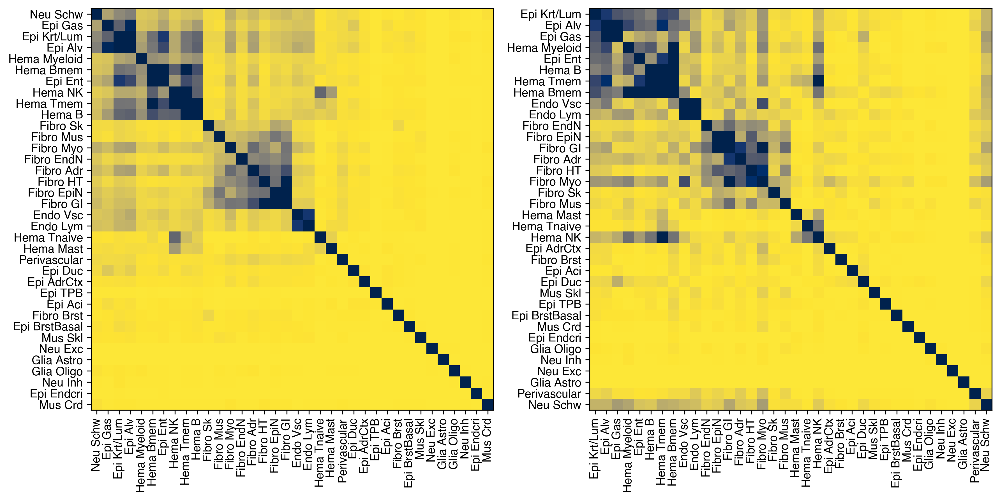

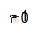

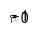

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=300)
for i in range(2):
    tmp = pd.DataFrame(score[i], index=legname, columns=legname)
    tmp = tmp + tmp.T
    cg = sns.clustermap(tmp, metric="cosine", figsize=(0.1, 0.1))
    rorder = cg.dendrogram_row.reordered_ind.copy()
    corder = cg.dendrogram_col.reordered_ind.copy()
    ax = axes[i]
    ax.imshow(tmp.values[rorder][:, corder], cmap="cividis", vmin=[0.8, 0.6][i], vmax=1)
    ax.set_xticks(np.arange(len(leg)))
    ax.set_yticks(np.arange(len(leg)))
    ax.set_xticklabels(legname[corder], rotation=90)
    ax.set_yticklabels(legname[rorder])

fig.tight_layout()
fig.savefig("mCH_clustering/100kCH_L1_rocpr.pdf", transparent=True)

In [30]:
L1_meta = L1_meta.drop(["c35", "c36"], axis=0)

In [31]:
group_list = list(L1_meta.index)
print(len(group_list))

In [32]:
mch_adata.obs["L1"] = mch_adata.obs["L1"].astype(str)
selc = mch_adata.obs["L1"] == "c35"
mch_adata.obs.loc[selc, "L1"] = "c7"

In [33]:
for xx in group_list:
    tmp = mch_adata[mch_adata.obs["L1"] == xx].copy()
    tmp.write_h5ad(f"{outdir}L1/{xx}/100kCH.h5ad")

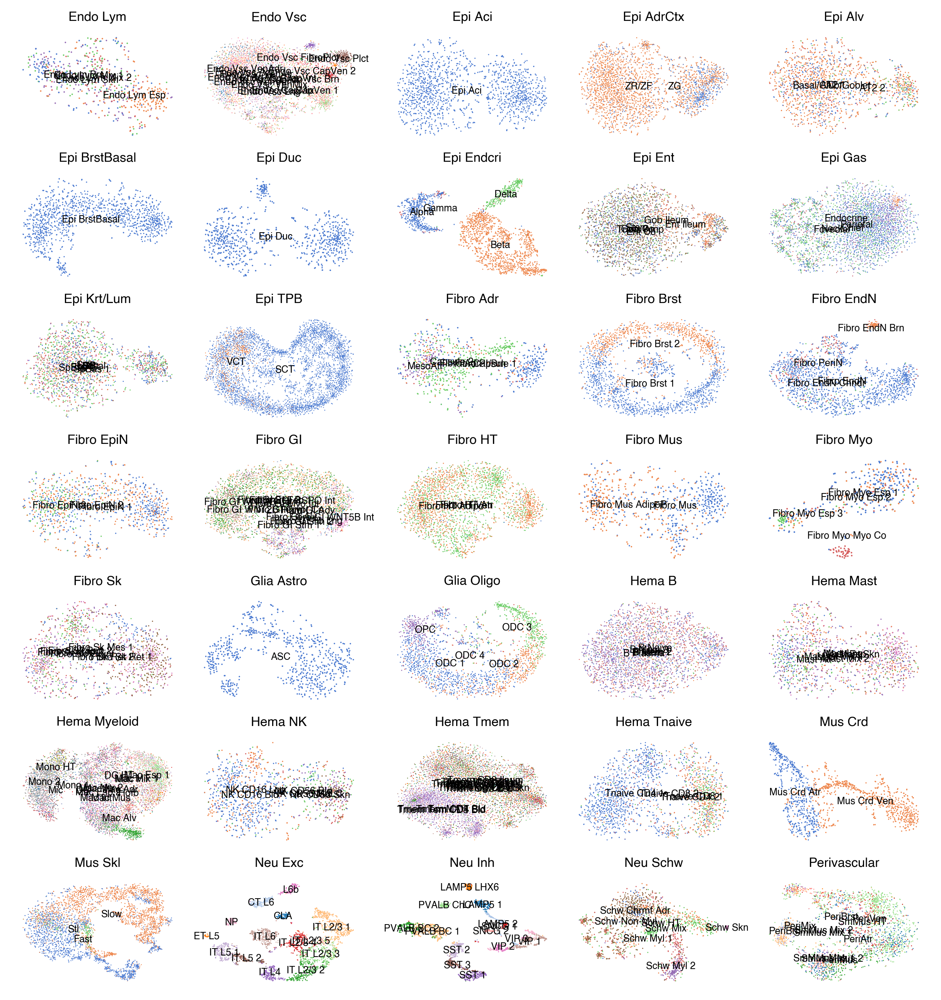

In [34]:
coord_base = "tsne"

fig, axes = plt.subplots(7, 5, figsize=(8, 8.5), dpi=300, constrained_layout=True)
for i, xx in enumerate(L1_meta.index):
    l1_name = L1_meta.loc[xx, "L1_abbr"]
    adata_tmp = anndata.read_h5ad(f"{outdir}L1/{xx}/100kCH_embed.h5ad")
    adata_tmp.obs["celltype"] = meta["celltype_L2_both_abbr"].astype(str)
    dump_embedding(adata_tmp, coord_base)
    leg = adata_tmp.obs["celltype"].unique()
    if len(leg) <= 10:
        palette = "muted"
    else:
        palette = "tab20"
    print(xx, len(leg))
    ds = 20 / np.sqrt(adata_tmp.shape[0])
    ax = axes.flatten()[i]
    tmp = adata_tmp.obs.copy()
    _ = categorical_scatter(
        data=tmp,
        ax=ax,
        coord_base=coord_base,
        hue="celltype",
        s=ds,
        max_points=None,
        palette=palette,
        scatter_kws={"rasterized": True},
        axis_format="empty",
    )
    for yy, (x, y) in tmp.groupby("celltype")[["tsne_0", "tsne_1"]].mean().iterrows():
        ax.text(x, y, yy, ha="center", va="center", fontsize=6)

    ax.set_title(l1_name, fontsize=8)

for ax in axes.flatten()[L1_meta.shape[0] :]:
    ax.axis("off")

fig.savefig(f"{outdir}L1_mCH_seurat_tsne_celltype.pdf", transparent=True)